In [2]:
## Import libraries 

import cv2
import numpy as np
import os
import pandas as pd

from tqdm import tqdm
from glob import glob
from albumentations import RandomCrop, HorizontalFlip, VerticalFlip

from sklearn.model_selection import train_test_split
from PIL import Image

from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, UpSampling2D, Concatenate
from tensorflow.keras.models import Model
# from keras.utils import plot_model
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, Callback

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

In [10]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 10072679026182202133
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 23400611840
locality {
  bus_id: 2
  numa_node: 1
  links {
  }
}
incarnation: 14130846028955568921
physical_device_desc: "device: 0, name: GeForce RTX 3090, pci bus id: 0000:d8:00.0, compute capability: 8.6"
]


In [3]:
## Data Augmentation
## It was chosen the resolution of 1536x1024px keep the ratio of the original images (6000x4000px). 

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)
        
def augment_data(images, masks, save_path, augment=True):
    H = 1024
    W = 1536
    for x,y in tqdm(zip(images, masks), total=len(images)):
        name = x.split("/")[-1].split(".")
        image_name = name[0]
        image_extn = name[1]

        name = y.split("/")[-1].split(".")
        mask_name = name[0]
        mask_extn = name[1]       
        
        x = cv2.imread(x, cv2.IMREAD_COLOR)
        x = cv2.resize(x, (W, H))
        y = cv2.imread(y, cv2.IMREAD_COLOR)
        y = cv2.resize(y, (W, H))
        
        if augment == True:
            
            aug = RandomCrop(int(2*H/3), int(2*W/3), always_apply=False, p=1.0)
            augmented = aug(image=x, mask=y)
            x1 = augmented["image"]
            y1 = augmented["mask"]
 
            aug = HorizontalFlip(always_apply=False, p=1.0)
            augmented = aug(image=x, mask=y)
            x2 = augmented["image"]
            y2 = augmented["mask"]
            
            aug = VerticalFlip(always_apply=False, p=1.0)
            augmented = aug(image=x, mask=y)
            x3 = augmented["image"]
            y3 = augmented["mask"] 
            
            save_images = [x, x1, x2, x3]
            save_masks = [y, y1, y2, y3]            
          
        else:
            save_images = [x]
            save_masks = [y]
        
        idx = 0
        for i, m in zip(save_images, save_masks):
            i = cv2.resize(i, (W, H))
            m = cv2.resize(m, (W, H))
            
            tmp_img_name = f"{image_name}_{idx}.{image_extn}"
            tmp_msk_name = f"{mask_name}_{idx}.{mask_extn}" 
            
            image_path = os.path.join(save_path, "images", tmp_img_name)
            mask_path = os.path.join(save_path, "masks", tmp_msk_name)
            
            cv2.imwrite(image_path, i)
            cv2.imwrite(mask_path, m)

            idx+=1


path = "./drone_sementic/dataset/semantic_drone_dataset/"
images = sorted(glob(os.path.join(path, "original_images/*")))
masks = sorted(glob(os.path.join(path, "label_images_semantic/*")))
print(f"Original images:  {len(images)} - Original masks: {len(masks)}")

create_dir("./new_data/images/")
create_dir("./new_data/masks/")

save_path = "./new_data/"

augment_data(images, masks, save_path, augment=True)

images = sorted(glob(os.path.join(save_path, "images/*")))
masks = sorted(glob(os.path.join(save_path, "masks/*")))
print(f"Augmented images:  {len(images)} - Augmented masks: {len(masks)}")

  0%|          | 0/400 [00:00<?, ?it/s]

Original images:  400 - Original masks: 400


100%|██████████| 400/400 [04:45<00:00,  1.40it/s]

Augmented images:  1600 - Augmented masks: 1600


In [11]:
## Create dataframe

image_path =  os.path.join(save_path, "images/")
label_path = os.path.join(save_path, "masks/")

def create_dataframe(path):
    name = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            name.append(filename.split('.')[0])
    
    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df_images = create_dataframe(image_path)
df_masks = create_dataframe(label_path)
print('Total Images: ', len(df_images))
#print(df_images)

Total Images:  1600


In [12]:
## Split data

X_trainval, X_test = train_test_split(df_images['id'], test_size=0.1, random_state=19)
X_trainval=df_images['id']
X_train, X_val = train_test_split(X_trainval, test_size=0.2, random_state=19)

print(f"Train Size : {len(X_train)} images")
print(f"Val Size   :  {len(X_val)} images")
print(f"Test Size  :  {len(X_test)} images")

y_train = X_train #the same values for images (X) and labels (y)
y_test = X_test
y_val = X_val

img_train = [os.path.join(image_path, f"{name}.jpg") for name in X_train]
mask_train = [os.path.join(label_path, f"{name}.png") for name in y_train]
img_val = [os.path.join(image_path, f"{name}.jpg") for name in X_val]
mask_val = [os.path.join(label_path, f"{name}.png") for name in y_val]
img_test = [os.path.join(image_path, f"{name}.jpg") for name in X_test]
mask_test = [os.path.join(label_path, f"{name}.png") for name in y_test]

Train Size : 1280 images
Val Size   :  320 images
Test Size  :  160 images


In [13]:
## Define U-Net Model
## In order to minimize the dimension of the model, it is possible to reduce the number of the filters for each layer.
## To do this, scale by a factor 2 the variables filters_x and filters_b.


def conv_block(inputs, filters, pool=True):
    x = Conv2D(filters, 3, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    if pool == True:
        p = MaxPool2D((2,2))(x)
        return x, p
    else:
        return x
    
    
def build_unet(shape, num_classes):   
    inputs = Input(shape)
    
    filters_x = [32,64,96,128,128,96,64,32]
    filters_b = [256] 

    # Encoder
    x1, p1 = conv_block(inputs, filters_x[0], pool=True)
    x2, p2 = conv_block(p1, filters_x[1], pool=True)
    x3, p3 = conv_block(p2, filters_x[2], pool=True)
    x4, p4 = conv_block(p3, filters_x[3], pool=True)    
    
    # Bridge
    b1 = conv_block(p4, filters_b[0], pool=False)
    
    # Decoder
    u1 = UpSampling2D((2,2), interpolation='bilinear')(b1)
    c1 = Concatenate()([u1, x4])
    x5 = conv_block(c1, filters_x[4], pool=False)
    
    u2 = UpSampling2D((2,2), interpolation='bilinear')(x5)
    c2 = Concatenate()([u2, x3])
    x6 = conv_block(c2, filters_x[5], pool=False)
    
    u3 = UpSampling2D((2,2), interpolation='bilinear')(x6)
    c3 = Concatenate()([u3, x2])
    x7 = conv_block(c3, filters_x[6], pool=False)
    
    u4 = UpSampling2D((2,2), interpolation='bilinear')(x7)
    c4 = Concatenate()([u4, x1])
    x8 = conv_block(c4, filters_x[7], pool=False)
    
    # Output Layer
    output = Conv2D(num_classes, 1, padding='same', activation='softmax')(x8)

    return Model(inputs, output)

In [14]:
## Define the resolution of the images and the number of classes

H = 768   #to keep the original ratio 
W = 1152 
num_classes = 23

model = build_unet((W, H, 3), num_classes)  

In [15]:
## Show the summary of the U-Net model and its diagram

model.summary()
# plot_model(model,to_file='model.png')

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 1152, 768, 3 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 1152, 768, 32 896         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_18 (BatchNo (None, 1152, 768, 32 128         conv2d_19[0][0]                  
__________________________________________________________________________________________________
activation_18 (Activation)      (None, 1152, 768, 32 0           batch_normalization_18[0][0]     
____________________________________________________________________________________________

In [16]:
## Dataset Pipeline used for training the model

def read_image(x):
    x = cv2.imread(x, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (W, H))
    x = x/255.0
    x = x.astype(np.float32)
    return x


def read_mask(x):
    x = cv2.imread(x, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (W, H))
    x = x.astype(np.int32)
    return x


def tf_dataset(x,y, batch=4):
    dataset = tf.data.Dataset.from_tensor_slices((x,y))
    dataset = dataset.shuffle(buffer_size=500)
    dataset = dataset.map(preprocess)
    dataset = dataset.batch(batch)
    dataset = dataset.repeat()
    dataset = dataset.prefetch(2)
    return dataset
    

def preprocess(x,y):
    def f(x,y):
        x = x.decode()
        y = y.decode()
        image = read_image(x)
        mask = read_mask(y)
        return image, mask
    
    image, mask = tf.numpy_function(f,[x,y],[tf.float32, tf.int32])
    mask = tf.one_hot(mask, num_classes, dtype=tf.int32)
    image.set_shape([H, W, 3])    # In the Images, number of channels = 3. 
    mask.set_shape([H, W, num_classes])    # In the Masks, number of channels = number of classes. 
    return image, mask

In [14]:
## Train the model

# Seeding
np.random.seed(42)
tf.random.set_seed(42)

# Hyperparameters
shape = (H, W, 3)
num_classes = 23  
lr = 1e-4
batch_size = 4
epochs = 100

# Model
model = build_unet(shape, num_classes)
model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(lr), metrics=['accuracy'])

train_dataset = tf_dataset(img_train, mask_train, batch = batch_size)
valid_dataset = tf_dataset(img_val, mask_val, batch = batch_size)

train_steps = len(img_train)//batch_size
valid_steps = len(img_val)//batch_size

checkpointer = [
    ModelCheckpoint(filepath="./model.h5",monitor='val_loss',verbose=2,save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.1, verbose=2, min_lr=1e-6),
    EarlyStopping(monitor='val_loss', patience=10, verbose=2)
]

model.fit(train_dataset,
          steps_per_epoch=train_steps,
          validation_data=valid_dataset,
          validation_steps=valid_steps,
          epochs=epochs,
          callbacks=checkpointer
         )

Epoch 1/100
320/320 [==============================] - 167s 516ms/step - loss: 2.1477 - accuracy: 0.5349 - val_loss: 2.2407 - val_accuracy: 0.4595

Epoch 00001: val_loss improved from inf to 2.24065, saving model to ./model.h5
Epoch 2/100
320/320 [==============================] - 162s 507ms/step - loss: 1.6394 - accuracy: 0.6450 - val_loss: 1.4776 - val_accuracy: 0.6679

Epoch 00002: val_loss improved from 2.24065 to 1.47762, saving model to ./model.h5
Epoch 3/100
320/320 [==============================] - 164s 512ms/step - loss: 1.3952 - accuracy: 0.6773 - val_loss: 1.2499 - val_accuracy: 0.6921

Epoch 00003: val_loss improved from 1.47762 to 1.24986, saving model to ./model.h5
Epoch 4/100
320/320 [==============================] - 161s 505ms/step - loss: 1.2290 - accuracy: 0.7023 - val_loss: 1.1097 - val_accuracy: 0.7288

Epoch 00004: val_loss improved from 1.24986 to 1.10969, saving model to ./model.h5
Epoch 5/100
320/320 [==============================] - 162s 507ms/step - loss: 1

320/320 [==============================] - 165s 516ms/step - loss: 0.6244 - accuracy: 0.8330 - val_loss: 0.6497 - val_accuracy: 0.8155

Epoch 00078: val_loss improved from 0.65338 to 0.64972, saving model to ./model.h5
Epoch 79/100
320/320 [==============================] - 165s 515ms/step - loss: 0.6247 - accuracy: 0.8326 - val_loss: 0.6552 - val_accuracy: 0.8130

Epoch 00079: val_loss did not improve from 0.64972
Epoch 80/100
320/320 [==============================] - 166s 519ms/step - loss: 0.6226 - accuracy: 0.8328 - val_loss: 0.6524 - val_accuracy: 0.8137

Epoch 00080: val_loss did not improve from 0.64972
Epoch 81/100
320/320 [==============================] - 163s 510ms/step - loss: 0.6209 - accuracy: 0.8333 - val_loss: 0.6521 - val_accuracy: 0.8137

Epoch 00081: val_loss did not improve from 0.64972
Epoch 82/100
320/320 [==============================] - 165s 516ms/step - loss: 0.6192 - accuracy: 0.8343 - val_loss: 0.6504 - val_accuracy: 0.8144

Epoch 00082: val_loss did not im

In [17]:
## Prediction

create_dir('./results')  #create the folder for the predictions

# Seeding
np.random.seed(42)
tf.random.set_seed(42)

# Model
model = tf.keras.models.load_model("model.h5")

# Saving the masks
for x, y in tqdm(zip(img_test, mask_test), total=len(img_test)):
    name = x.split("/")[-1]
    
    ## Read image
    x = cv2.imread(x, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (W, H))
    x = x/255.0
    x = x.astype(np.float32)

    ## Read mask
    y = cv2.imread(y, cv2.IMREAD_GRAYSCALE)
    y = cv2.resize(y, (W, H))
    
    y = np.expand_dims(y, axis=-1) #(384,256,1)
    
    y = y * (255/num_classes)
    y = y.astype(np.int32)
    y = np.concatenate([y, y, y], axis=2)
    
    ## Prediction
    p = model.predict(np.expand_dims(x, axis=0))[0]
    p = np.argmax(p, axis=-1)
    
    p = np.expand_dims(p, axis=-1)  
    
    p = p * (255/num_classes)
    p = p.astype(np.int32)
    p = np.concatenate([p, p, p], axis=2)
      
    cv2.imwrite(f"./results/{name}", p)
    

100%|██████████| 160/160 [00:40<00:00,  3.95it/s]


In [19]:
# From the test set, take only images that represent the ones in the original dataset and not those are obtained from the data augmentation.
# (they have _0 in the name)

image_list = []
mask_list = []

for x,y in tqdm(zip(img_test, mask_test), total=len(img_test)):
    name = x.split("/")[-1]
    image_name = name[4]

    name = y.split("/")[-1]
    mask_name = name[4]
    
    if image_name == '0':
        image_list.append(x)
        mask_list.append(y)

100%|██████████| 160/160 [00:00<00:00, 145730.43it/s]


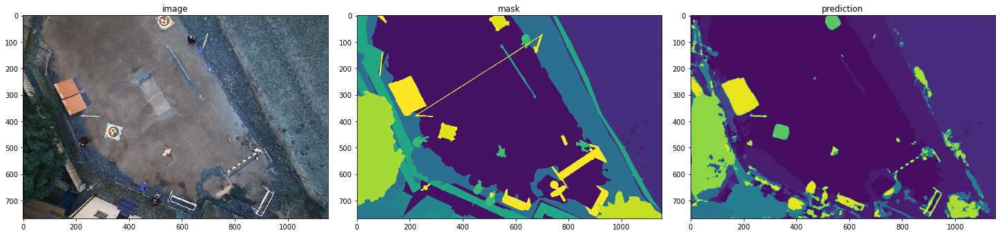

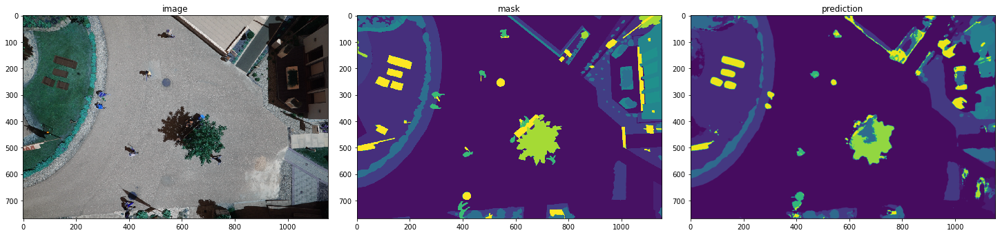

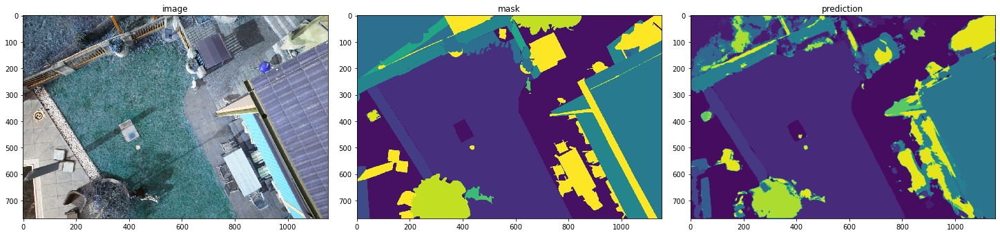

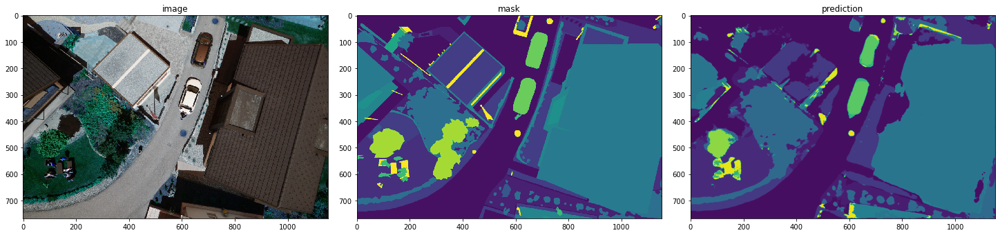

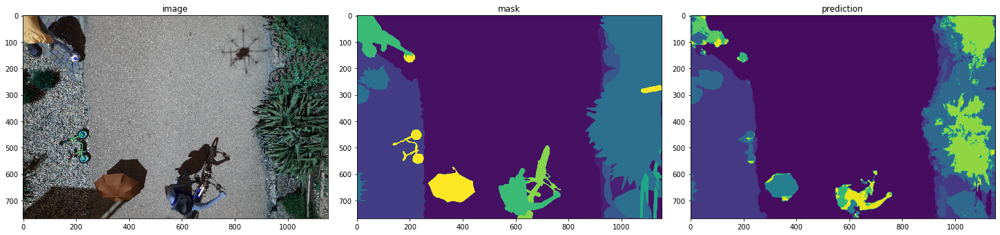

In [20]:
## Plot 5 images to verify the accuracy in the predictions

img_selection = image_list[10:15]
mask_selection = mask_list[10:15]

for img, mask in zip(img_selection, mask_selection):
    name = img.split("/")[-1]
    x = cv2.imread(img, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (W, H))

    y = cv2.imread(mask, cv2.IMREAD_GRAYSCALE)
    y = cv2.resize(y, (W, H))


    p = cv2.imread(f"./results/{name}", cv2.IMREAD_GRAYSCALE)
    p = cv2.resize(p, (W, H))

    #Plotto le tre immagini
    fig, axs = plt.subplots(1, 3, figsize=(20, 20), constrained_layout=True)

    axs[0].imshow(x, interpolation = 'nearest')
    axs[0].set_title('image')
    axs[0].grid(False)

    axs[1].imshow(y, interpolation = 'nearest')
    axs[1].set_title('mask')
    axs[1].grid(False)

    axs[2].imshow(p)
    axs[2].set_title('prediction')
    axs[2].grid(False)

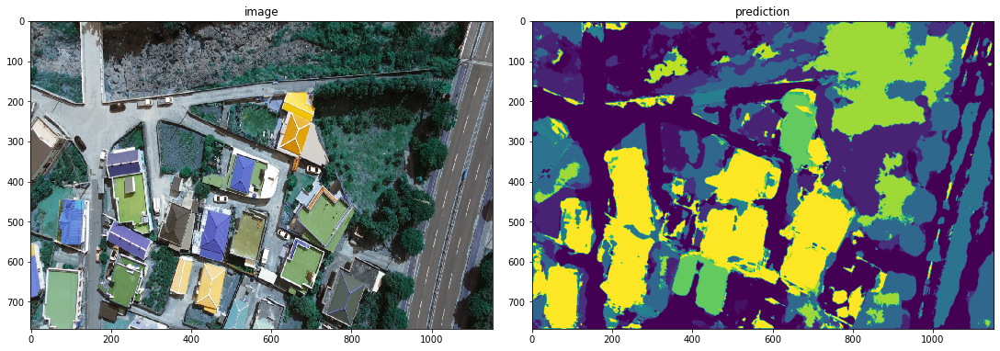

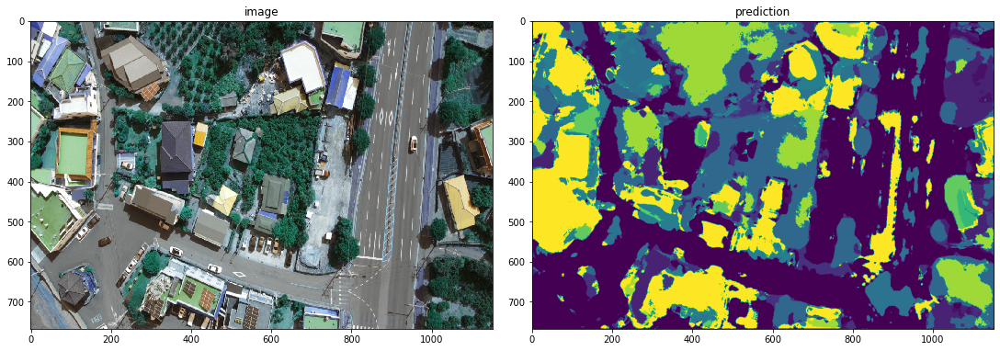

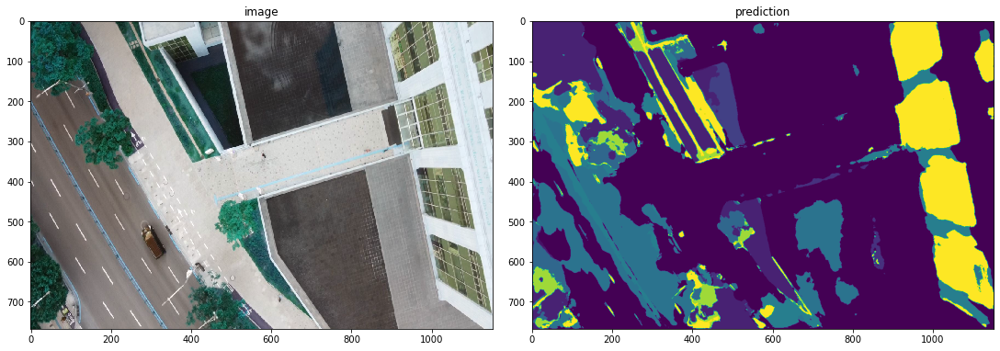

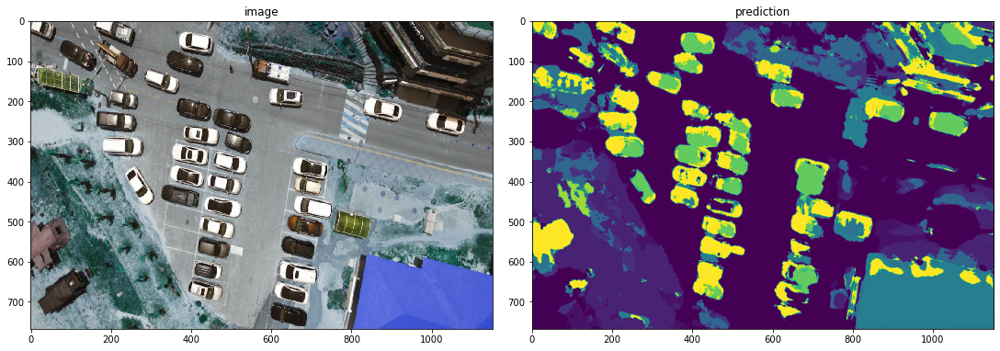

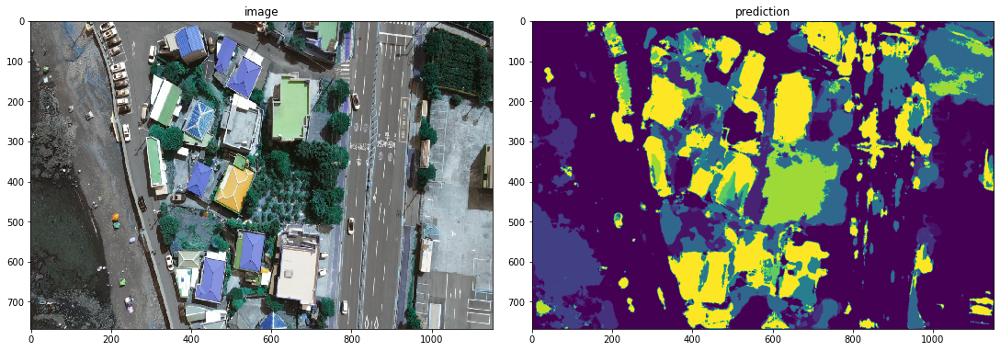

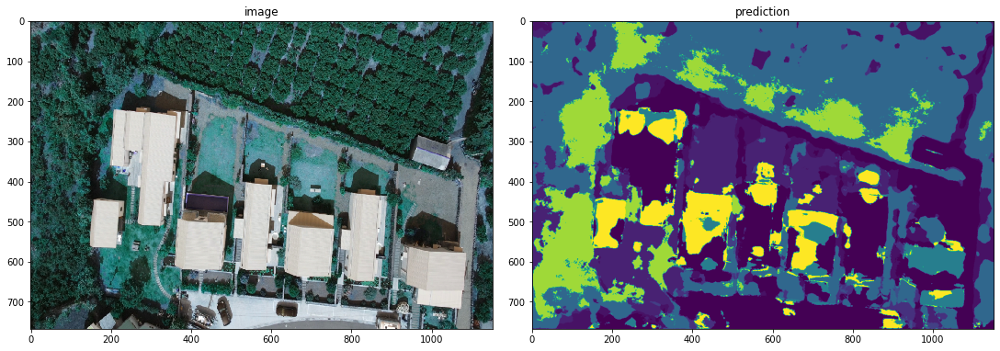

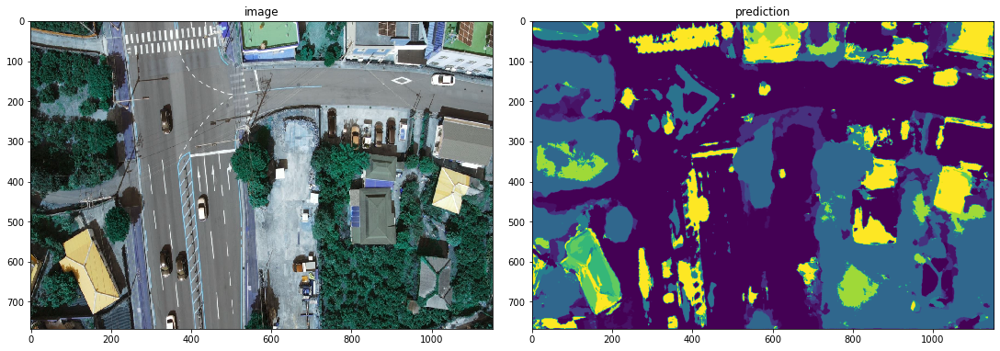

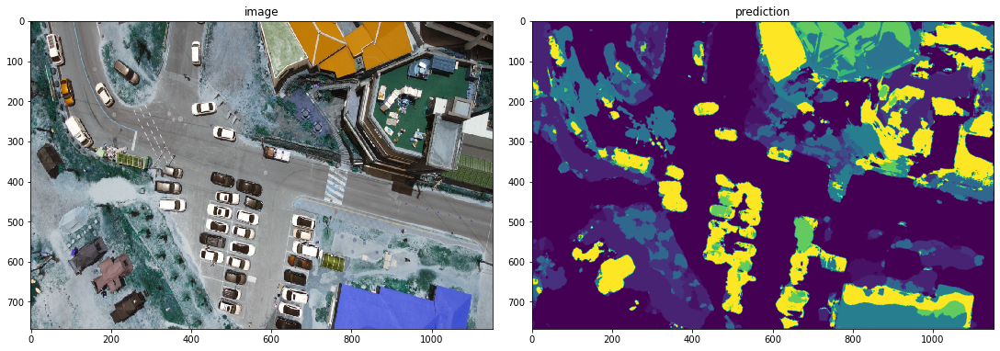

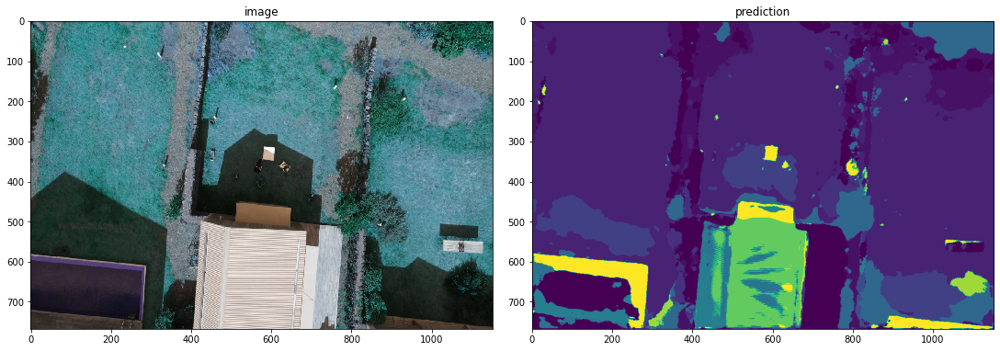

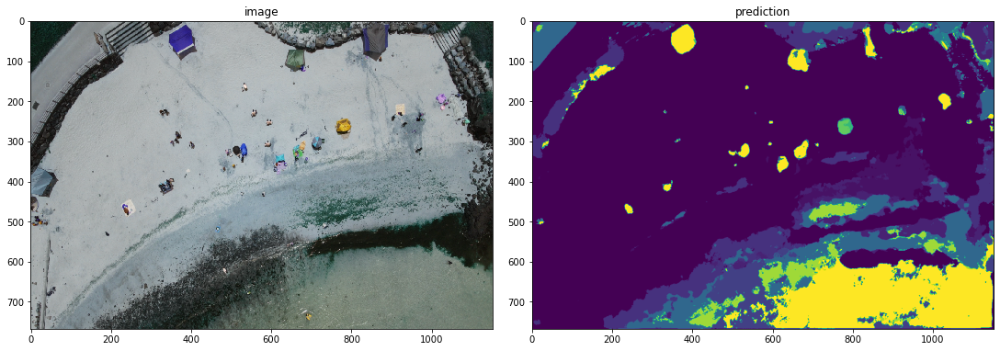

In [21]:
# predict my own test dataset

from PIL import Image
import glob
images = glob.glob('./jeju/images/*.jpg')

for fname in images:
    
    original_image = fname
    H = 768  
    W = 1152

    x = cv2.imread(original_image, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (W, H))
    x = x/255.0
    x = x.astype(np.float32)

    p = model.predict(np.expand_dims(x, axis=0))[0]
    p = np.argmax(p, axis=-1)

    p = np.expand_dims(p, axis=-1)  

    p = p * (255/num_classes)
    p = p.astype(np.float32)
    p = np.concatenate([p, p, p], axis=2)

    cv2.imwrite(f"./jeju_results/a.png", p)

    p = cv2.imread(f"./jeju_results/a.png", cv2.IMREAD_GRAYSCALE)
    p = cv2.resize(p, (W, H))


    fig, axs = plt.subplots(1, 2, figsize=(15, 15), constrained_layout=True)

    axs[0].imshow(x, interpolation = 'nearest')
    axs[0].set_title('image')
    axs[0].grid(False)

    axs[1].imshow(p)
    axs[1].set_title('prediction')
    axs[1].grid(False)